In [13]:
import numpy as np 
import scipy
import matplotlib.pyplot as plt
import pandas as pd

from neural_tuning import generate_tuning_curves, generate_spikes, plot_raster, create_spikes_array
%matplotlib inline
seed = 10050
chars = ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j', 'k', 'l', 'm', 
'n', 'o', 'p', 'q', 'r', 's', 't', 'u', 'v', 'w', 'x', 'y', 'z', '>', ',',
"'", '~', '?']

In [14]:
tuning_data = scipy.io.loadmat('../datafiles/tuning.mat')
tuning_data = np.array(tuning_data['tuningMat'])

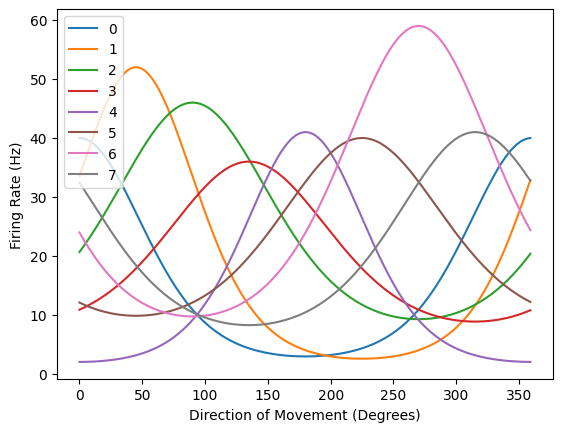

In [15]:
for n in range(tuning_data.shape[0]):
    plt.plot(tuning_data[n], label = n)

plt.xlabel('Direction of Movement (Degrees)')
plt.ylabel('Firing Rate (Hz)')
plt.legend()
plt.show()

In [25]:
n_units = 192
tuning_curves = generate_tuning_curves(tuning_data, n_units, seed)
print(tuning_curves.shape)

(192, 360)


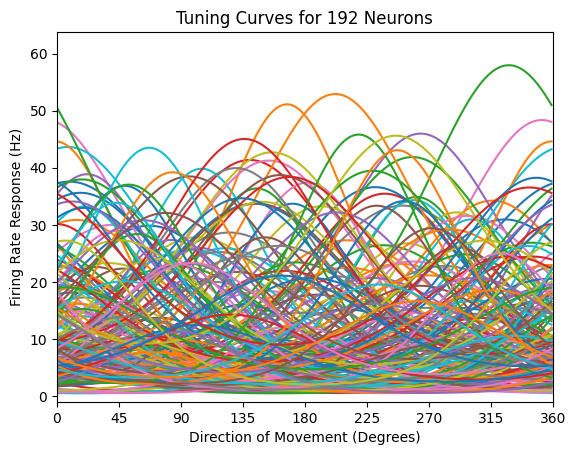

In [17]:
for n in range(n_units):
    plt.plot(tuning_curves[n])

plt.title('Tuning Curves for {} Neurons'.format(int(n_units)))
plt.xlabel('Direction of Movement (Degrees)')
plt.ylabel('Firing Rate Response (Hz)')
plt.xlim([0, 360])
plt.ylim([-1, np.max(tuning_curves)*1.1])
plt.xticks([0, 45, 90, 135, 180, 225, 270, 315, 360])
plt.show()

In [18]:
time_data = dict()
spikes = dict()
smoothed = dict()

for i in range(31):
    base_dir = '~/leapTracker/datafiles/letters'
    filename = os.path.join(base_dir, 'character_{}_trial3.csv'.format(i))
    spikes_array, smoothed_spikes, time, dt, z, x, vz, vx = create_spikes_array(filename, tuning_curves, seed)
    time_data['character_' + chars[i]] = np.concatenate((time, dt, z, x, vz, vx), axis=1)
    spikes['character_' + chars[i]] = spikes_array
    smoothed['character_' + chars[i]] = smoothed_spikes

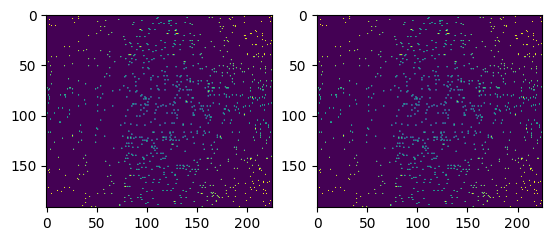

In [20]:
plt.subplot(1,2,1)
plt.imshow(spikes['character_?'])

plt.subplot(1,2,2)
plt.imshow(spikes_array)

In [21]:
std_dev = np.std(spikes_array)
print(std_dev)
means = np.mean(spikes_array.T, axis=0).reshape(1,-1)
print(means.shape)

0.1472554047743368
(1, 192)


In [22]:
spikes_array_ = spikes_array.T - means
print(spikes_array_.shape)
spikes_array_ /= std_dev
print(spikes_array_.shape)
smoothed_spikes = scipy.ndimage.gaussian_filter1d(spikes_array_, 3.0, axis=1)

# print(spikes_array.shape)

# print(spikes_array)

(225, 192)
(225, 192)


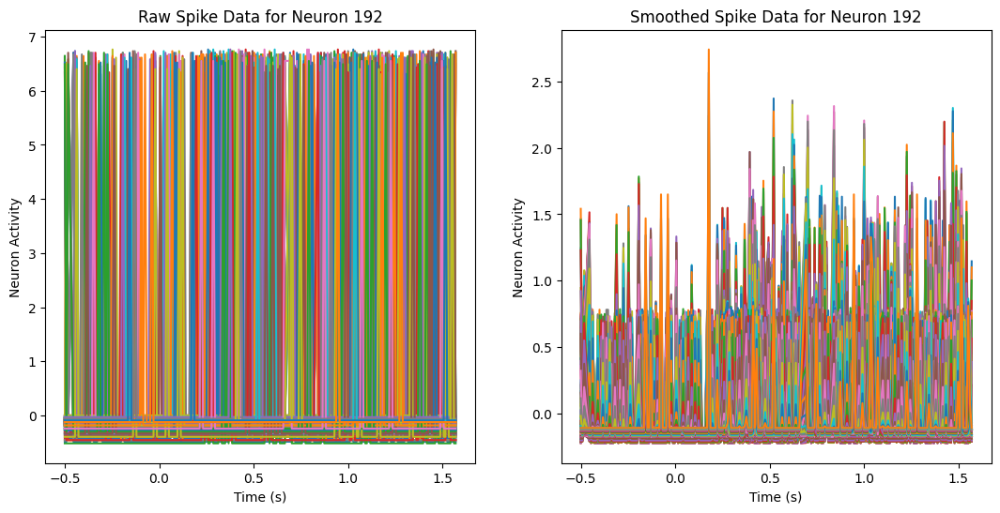

In [23]:
# n = 150


fig = plt.figure(figsize=(13,6))

ax1 = fig.add_subplot(121)
ax1.plot(time-0.5, spikes_array_)
# ax1.set_xlim([0, time[-1]])
# ax1.set_ylim([-0.05, 1.1])
ax1.set_xlabel('Time (s)')
ax1.set_ylabel('Neuron Activity')
ax1.set_title('Raw Spike Data for Neuron {}'.format(n+1))

ax2 = fig.add_subplot(122)
ax2.plot(time-0.5, smoothed_spikes)
# ax2.set_xlim([0, time[-1]])
# ax2.set_ylim([-0.05, np.max(smoothed_spikes)*1.1])
ax2.set_xlabel('Time (s)')
ax2.set_ylabel('Neuron Activity')
ax2.set_title('Smoothed Spike Data for Neuron {}'.format(n+1))

plt.show()

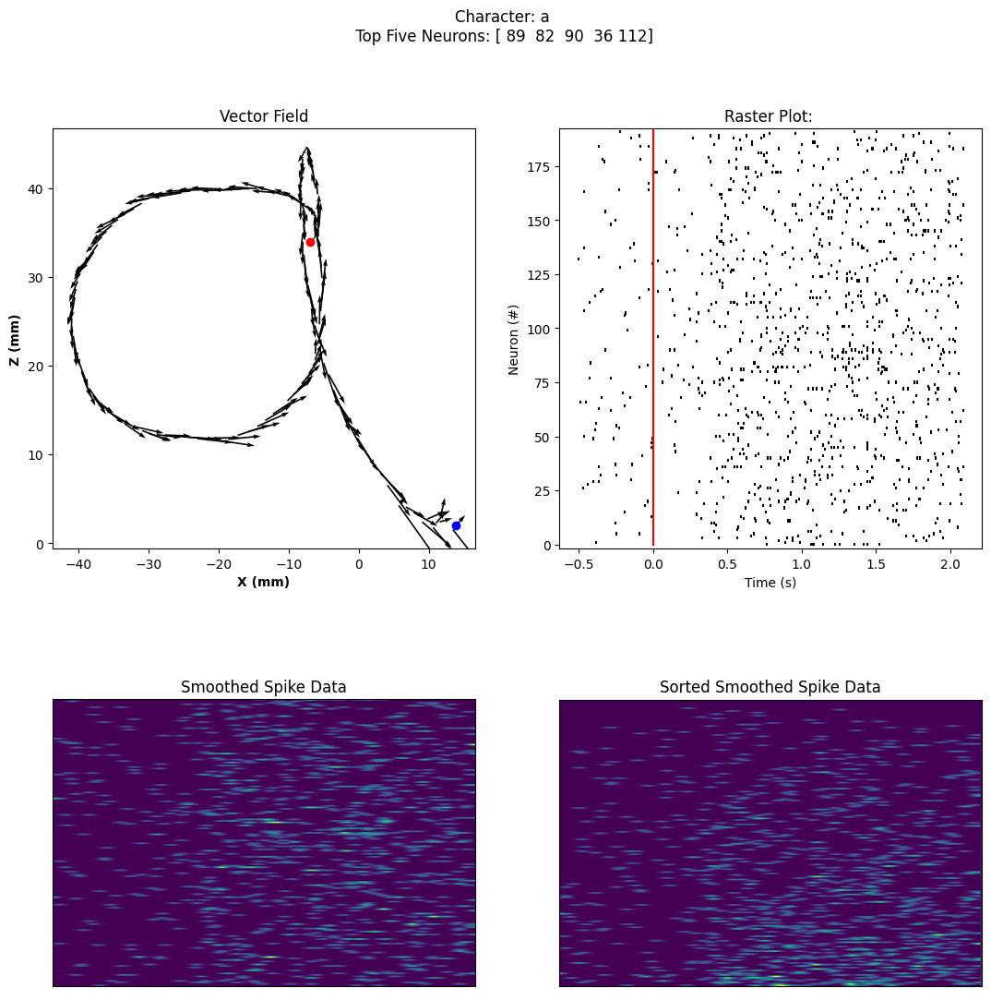

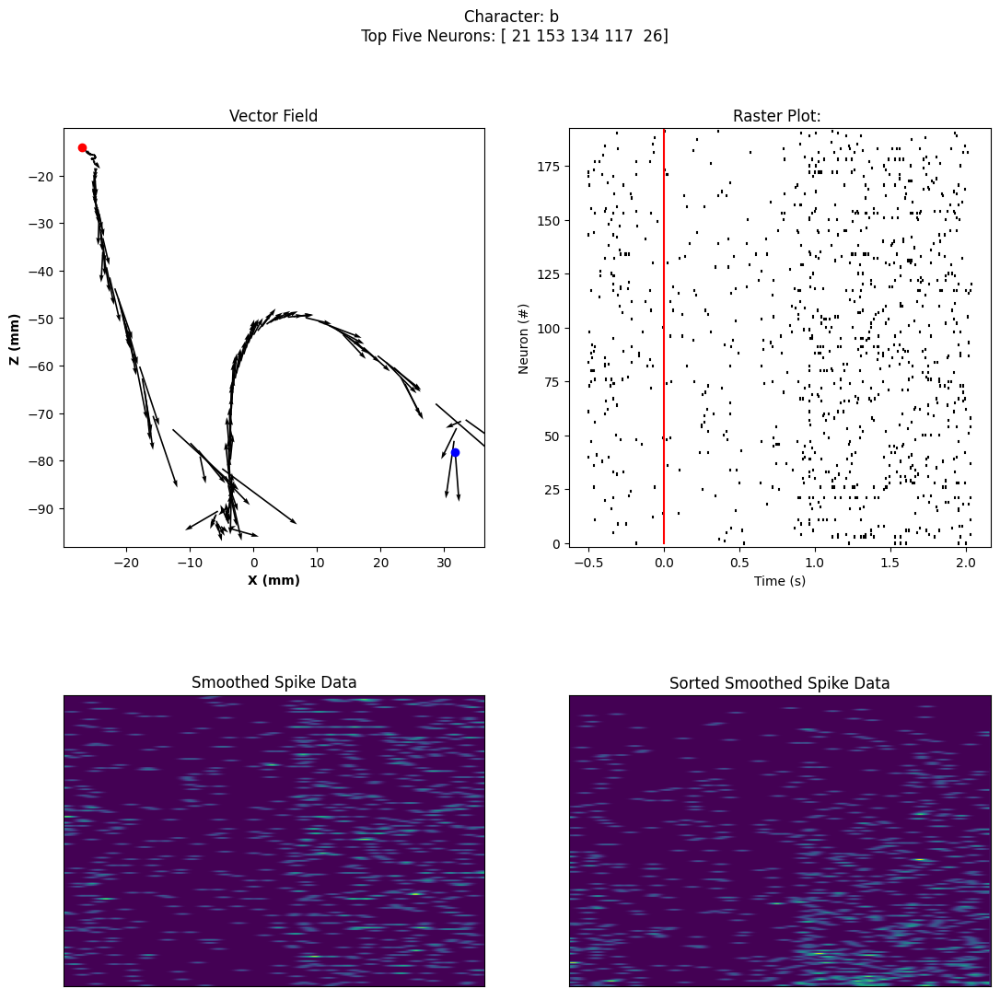

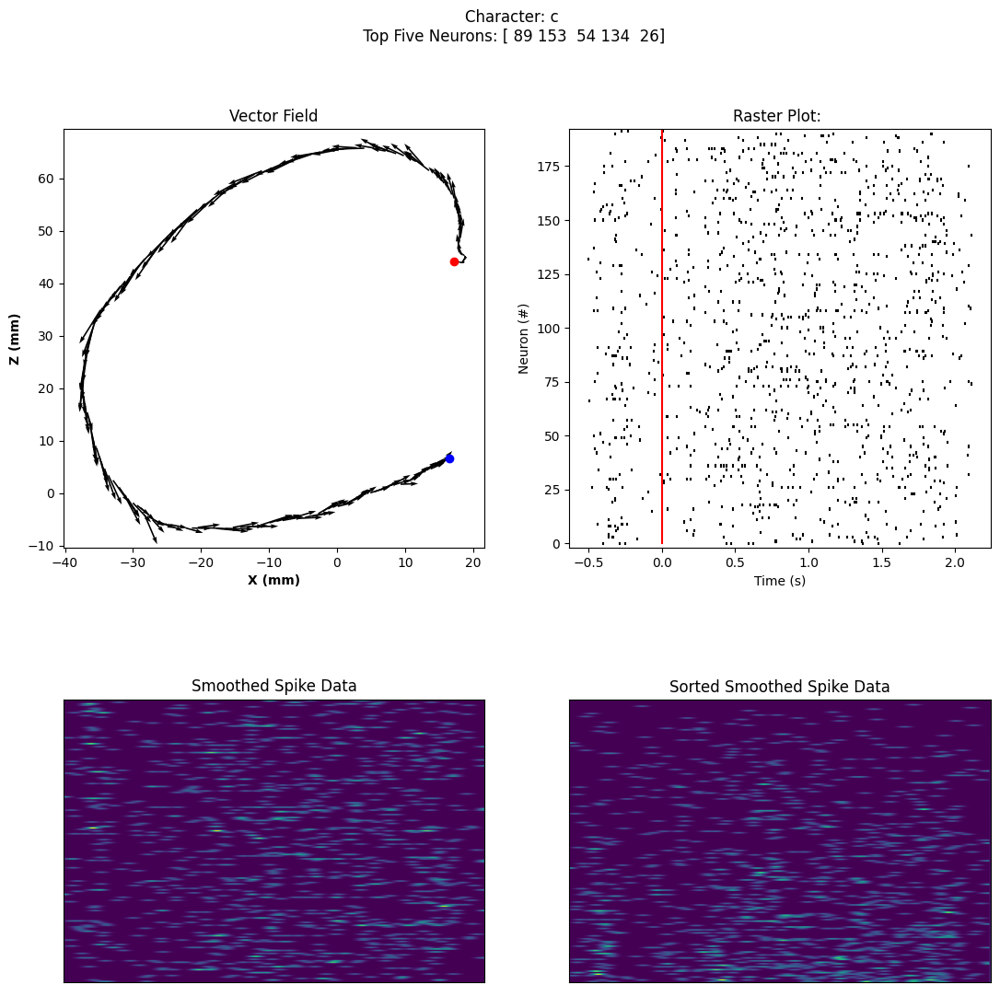

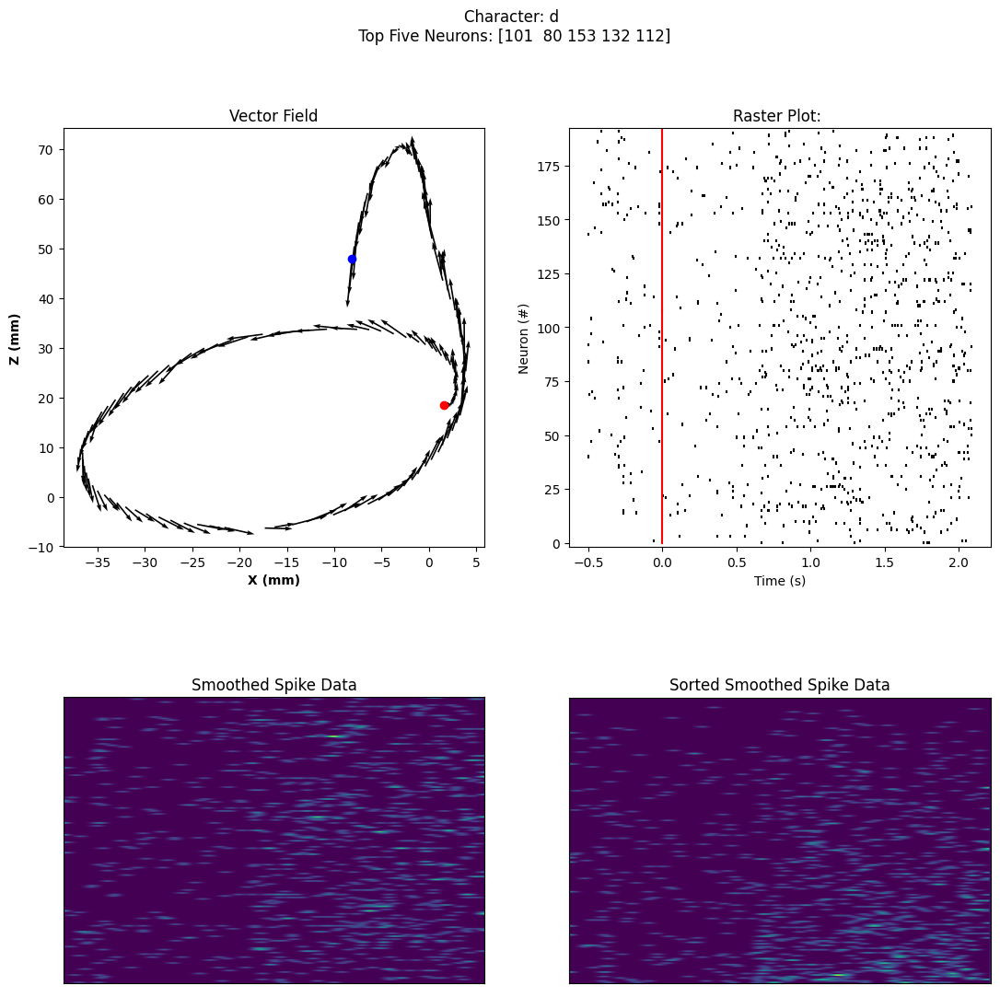

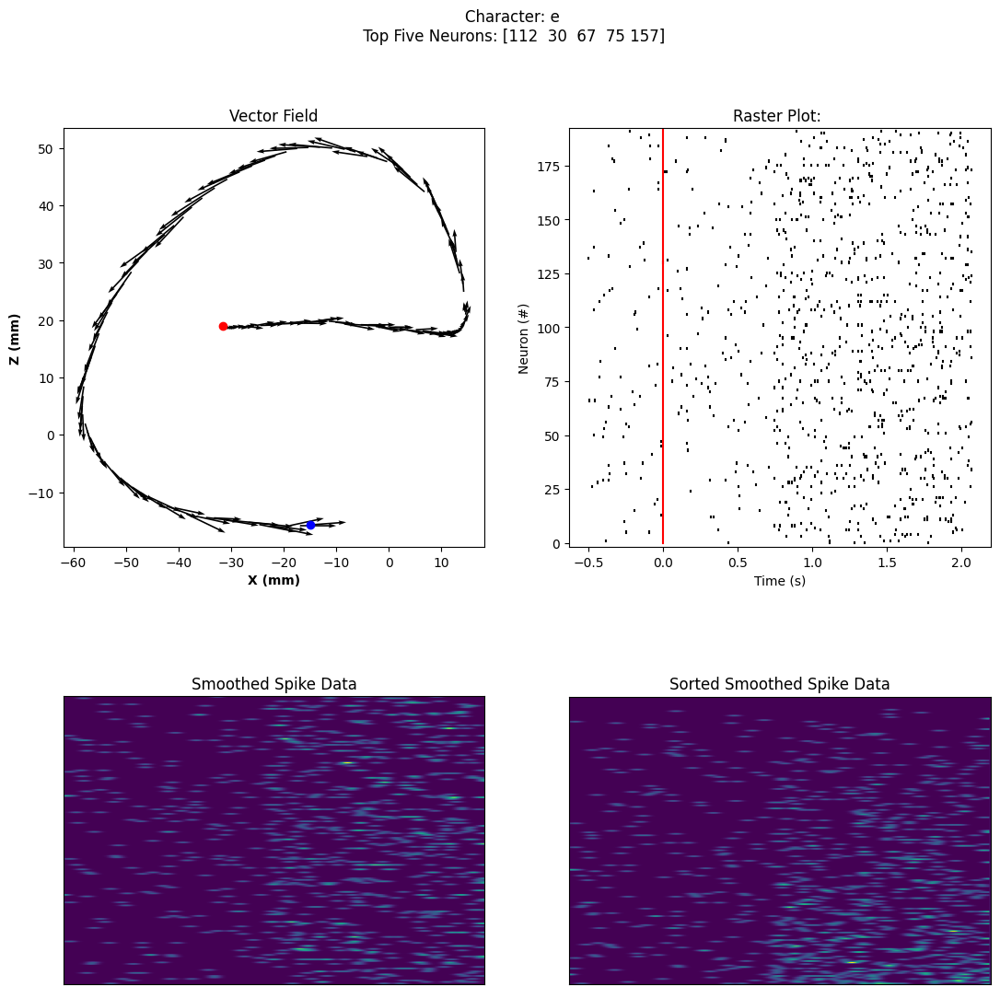

...

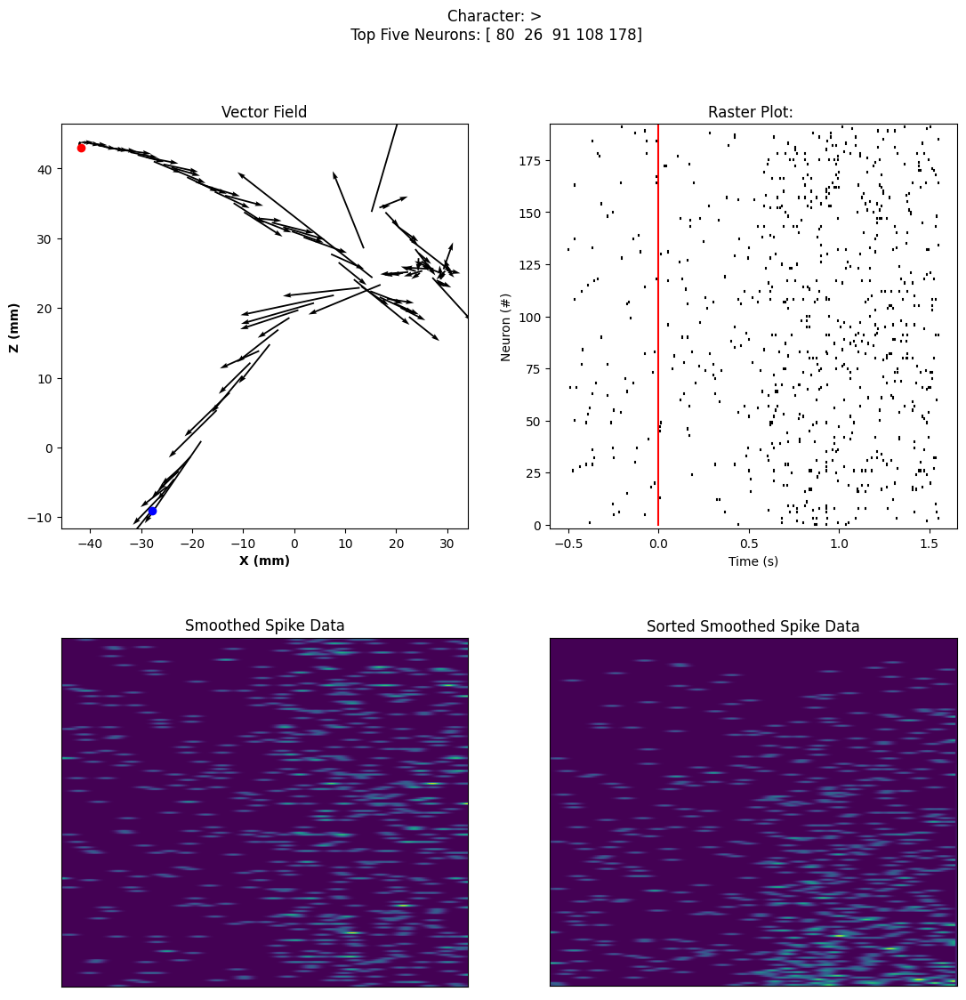

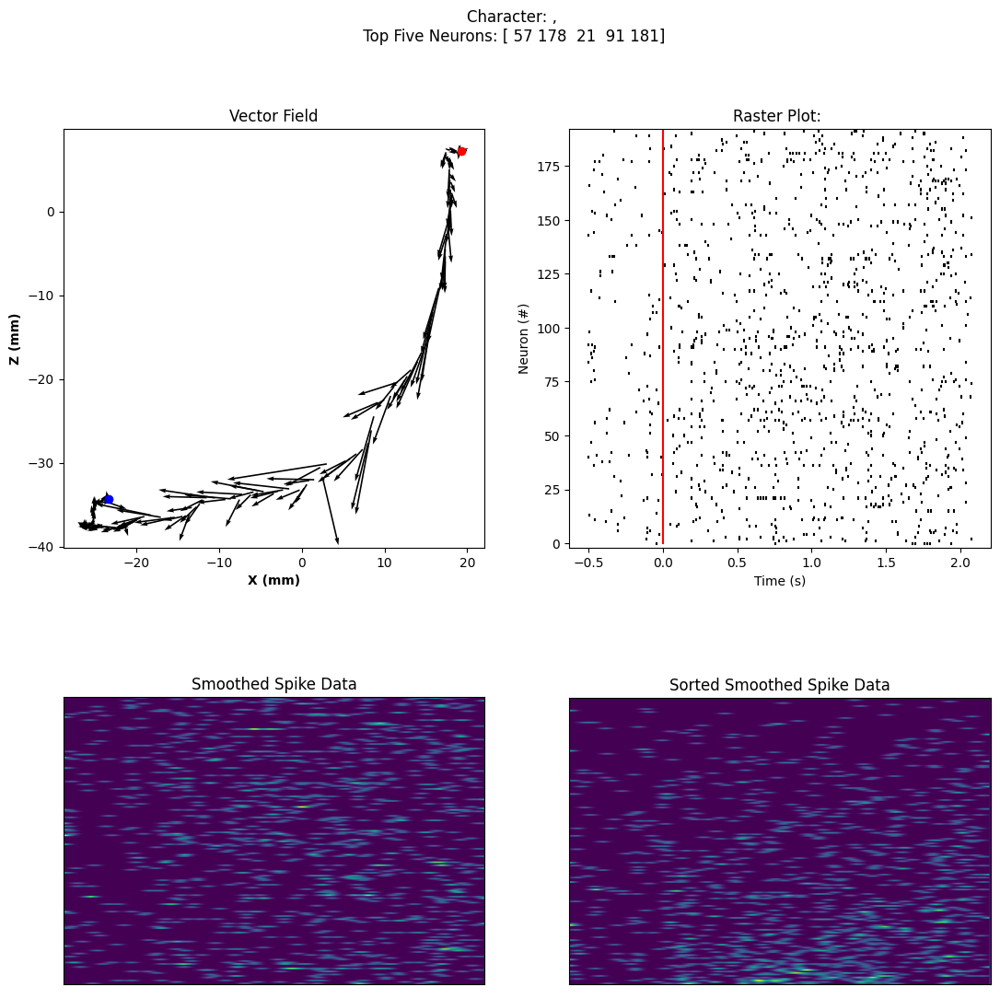

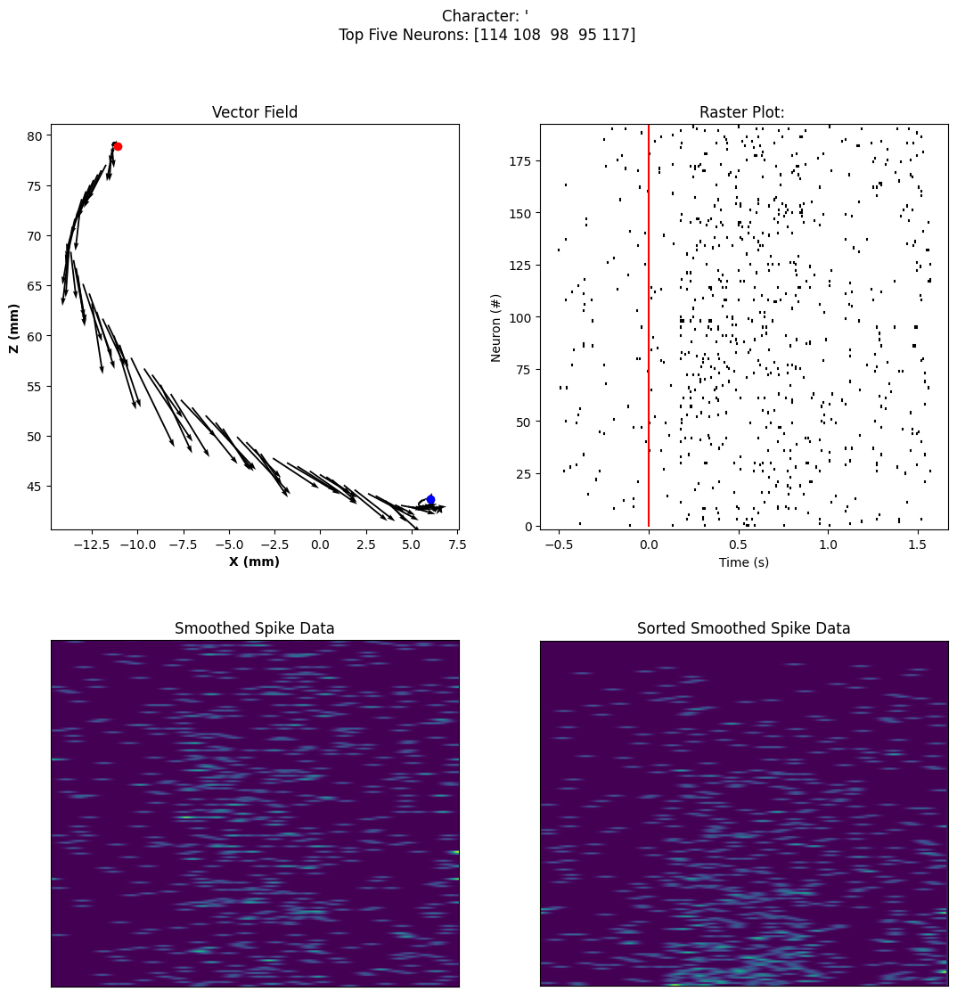

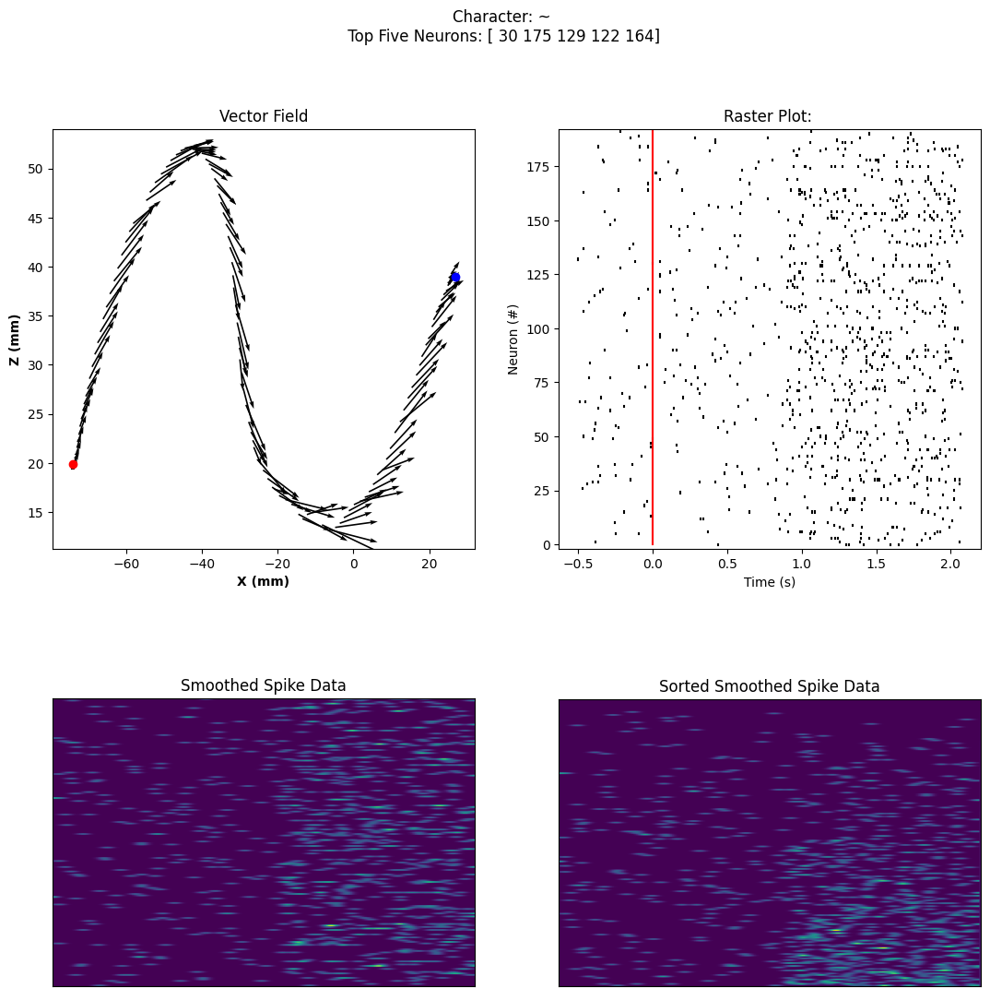

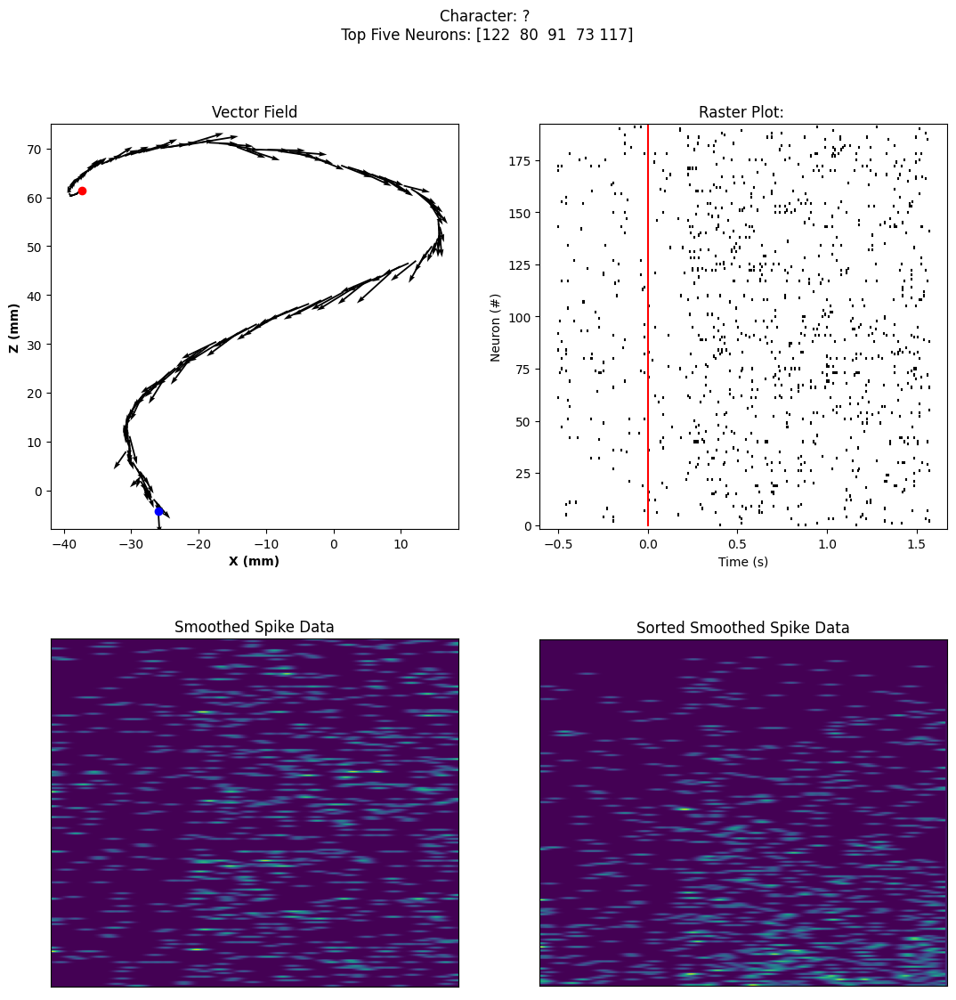

In [24]:
cue = 0.5
for char in chars:
    smoothed_spikes = smoothed['character_'+char]
    timing = time_data['character_'+char]
    spikes_data = spikes['character_'+char]

    time = timing[:,0]
    dt = timing[:,1]
    z =  timing[:,2]
    x = timing[:,3]
    vz = timing[:,4]
    vx = timing[:,5]

    mns = np.mean(spikes_data, axis=1)
    mns_data = np.concatenate((smoothed_spikes, mns.reshape(-1,1)), axis=1)
    tops = np.argpartition(mns, -5)
    mns_data_sorted = mns_data[mns_data[:,-1].argsort()]

    fig = plt.figure(figsize=(13,13))
    plt.suptitle('Character: {}\n Top Five Neurons: {}'.format(char, np.flip(tops[-5:])))

    ax1 = fig.add_subplot(221)
    ax1.plot(x[0], z[0], marker='o', color='red')
    ax1.plot(x[-1], z[-1], marker='o', color='blue')
    ax1.quiver(x, z, vx, vz)
    ax1.set_xlabel('X (mm)', fontweight='bold')
    ax1.set_ylabel('Z (mm)', fontweight='bold')
    ax1.set_title('Vector Field')

    ax2 = fig.add_subplot(222)
    plot_raster(time, cue, spikes_data, '')

    ax3 = fig.add_subplot(223)
    ax3.imshow(smoothed_spikes)
    ax3.set_title('Smoothed Spike Data')
    ax3.set_xticks([])
    ax3.set_yticks([])

    ax4 = fig.add_subplot(224)
    ax4.imshow(mns_data_sorted)
    ax4.set_title('Sorted Smoothed Spike Data')
    ax4.set_xticks([])
    ax4.set_yticks([])
    plt.show()